<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Overview" data-toc-modified-id="Overview-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Overview</a></span></li><li><span><a href="#Imports-and-function-definitions" data-toc-modified-id="Imports-and-function-definitions-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Imports and function definitions</a></span></li><li><span><a href="#Read-data" data-toc-modified-id="Read-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Read data</a></span><ul class="toc-item"><li><span><a href="#Read-sample-data" data-toc-modified-id="Read-sample-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Read sample data</a></span></li><li><span><a href="#Read-reference-data" data-toc-modified-id="Read-reference-data-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Read reference data</a></span></li></ul></li><li><span><a href="#NMF-on-Reference" data-toc-modified-id="NMF-on-Reference-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>NMF on Reference</a></span><ul class="toc-item"><li><span><a href="#Check-if-the-basis-derived-from-NMF-is-interpretable" data-toc-modified-id="Check-if-the-basis-derived-from-NMF-is-interpretable-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Check if the basis derived from NMF is interpretable</a></span></li><li><span><a href="#Derive-certainty-thresholds" data-toc-modified-id="Derive-certainty-thresholds-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Derive certainty thresholds</a></span></li></ul></li><li><span><a href="#NMFreg-on-Sample" data-toc-modified-id="NMFreg-on-Sample-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>NMFreg on Sample</a></span><ul class="toc-item"><li><span><a href="#Deconvolved-sample" data-toc-modified-id="Deconvolved-sample-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Deconvolved sample</a></span></li><li><span><a href="#Plot-certainty-per-cell-type-(Thresholded)" data-toc-modified-id="Plot-certainty-per-cell-type-(Thresholded)-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Plot certainty per cell type (Thresholded)</a></span></li><li><span><a href="#Plot-all-celltypes-(Thresholded)" data-toc-modified-id="Plot-all-celltypes-(Thresholded)-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Plot all celltypes (Thresholded)</a></span></li><li><span><a href="#Plot-Binary-(Thresholded)" data-toc-modified-id="Plot-Binary-(Thresholded)-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Plot Binary (Thresholded)</a></span></li><li><span><a href="#Plot-Certainty-(Thresholded)" data-toc-modified-id="Plot-Certainty-(Thresholded)-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Plot Certainty (Thresholded)</a></span></li><li><span><a href="#Bar-plots" data-toc-modified-id="Bar-plots-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Bar plots</a></span></li></ul></li></ul></div>

# Overview

Given: 
* a sample - consisting of composite measurements that one wishes to deconvolve, e.g. a Slide-seq puck dataframe of dimentions number of beads by number of genes
* a reference - a collection of annotated examples, e.g. cerebellum DGE of dimentions number of cells by number of genes, along with a vector of clusters of length number of cells

NMFreg approach:
* apply non-negative matrix factorization (**NMF**) to the reference and verify that the resulting basis is interpretable with the respect to the annotation
* project, i.e. **reg**ress (via non-negative least squares (NNLS)) the sample onto the basis

# Imports and function definitions





If are not already running this in Colab, and you would like to, click this:

<a href="https://colab.research.google.com/github/tudaga/NMFreg_tutorial/blob/master/NMFreg_Tutorial_cerebellum_puck180430_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import sys, subprocess, shutil
IN_COLAB = 'google.colab' in sys.modules
print('Using colab?: {}'.format(IN_COLAB))
def run_cmd(cmd):
    print('Output of "{}":'.format(cmd))
    print(subprocess.run(cmd,stdout=subprocess.PIPE, shell=True).stdout.decode('utf-8'))
        
if IN_COLAB:
    run_cmd('sudo apt-get install git-lfs')
    run_cmd('git lfs install')
    run_cmd('rm -rf NMFreg_tutorial')
    run_cmd('git clone --verbose --progress https://github.com/tudaga/NMFreg_tutorial.git')
    run_cmd('mv NMFreg_tutorial/* .')
    run_cmd('rm -r NMFreg_tutorial')

Using colab?: False


In [1]:
import pandas as pd
import numpy as np
import os
from IPython.display import display
import seaborn as sns
import scipy.stats
import scipy.optimize
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import NMF
from matplotlib import colors
import matplotlib.patches as mpatches
import collections

%pylab inline

rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False

Populating the interactive namespace from numpy and matplotlib


In [2]:
def plot_one_gene(gene):
    plt.figure(figsize(10, 10))
    pyplot.set_cmap('viridis_r')
    plt.scatter(coords['x'], coords['y'], c=counts[gene], s=2, alpha=0.6)
    plt.axis('equal')
    plt.title('{}'.format(gene))
    plt.colorbar()
    plt.show()
    
def deconv_factor_to_celltype(row, adict):
    global K
    global num_atlas_clusters
    nc = num_atlas_clusters
    tmp_list = [0]*nc
    for key in range(K):
        item = adict[key] - 1
        tmp_list[item] += row[key]**2
    return pd.Series(np.sqrt(tmp_list))


def NMFreg(counts, coords, size):
    global metacell_dict
    global gene_intersection
    global num_atlas_clusters
    global celltype_to_factor_dict
    global celltype_dict
    global plot_size_dict

    puckcounts = counts[['barcode'] + gene_intersection]
    puckcounts = puckcounts.set_index(counts['barcode'])
    puckcounts = puckcounts.drop('barcode', axis=1)

    cell_totalUMI = np.sum(puckcounts, axis = 1)
    puckcounts_cellnorm = np.divide(puckcounts, cell_totalUMI[:,None])
    puckcounts_scaled = StandardScaler(with_mean=False).fit_transform(puckcounts_cellnorm)

    XsT = puckcounts_scaled.T

    Hs_hat = []
    for b in tqdm(range(XsT.shape[1])):
        h_hat = scipy.optimize.nnls(WaT, XsT[:, b])[0]
        if b == 0:
            Hs_hat = h_hat
        else:
            Hs_hat = np.vstack((Hs_hat, h_hat))

    Hs = pd.DataFrame(Hs_hat)
    Hs['barcode'] = puckcounts.index.tolist()

    Hs_norm = StandardScaler(with_mean=False).fit_transform(Hs.drop('barcode', 
                                                                    axis=1))

    Hs_norm = pd.DataFrame(Hs_norm)
    Hs_norm['barcode'] = puckcounts.index.tolist()

    
    maxloc_s = Hs_norm.drop('barcode', axis=1).values.argmax(axis=1)
    barcode_clusters = pd.DataFrame()
    barcode_clusters['barcode'] = Hs_norm['barcode']
    barcode_clusters['max_factor'] = maxloc_s

    barcode_clusters['atlas_cluster'] = barcode_clusters['barcode']

    for c in range(1, num_atlas_clusters + 1):
        condition = np.isin(barcode_clusters['max_factor'], 
                            celltype_to_factor_dict[c])
        barcode_clusters['atlas_cluster'][condition] = c       
        
    bead_deconv_df = Hs_norm.apply(lambda x: deconv_factor_to_celltype(row=x, 
                                            adict=factor_to_celltype_dict), 
                                   axis = 1)
    bead_deconv_df.insert(0, 'barcode', Hs_norm['barcode'])
    bead_deconv_df.columns = ['barcode'] + (bead_deconv_df.columns[1:]+1).tolist()
    bead_deconv_df = pd.DataFrame(bead_deconv_df)
    bead_deconv_df = bead_deconv_df.rename(columns = celltype_dict)
    
    maxloc_ct = bead_deconv_df.drop('barcode', axis=1).values.argmax(axis=1)+1
    bead_maxct_df = pd.DataFrame()
    bead_maxct_df['barcode'] = bead_deconv_df['barcode']
    bead_maxct_df['max_cell_type'] = maxloc_ct
    
    return Hs, Hs_norm, puckcounts, bead_deconv_df, barcode_clusters, bead_maxct_df

def deconv_factor_to_celltype_sum(row, adict):
    global K
    global num_atlas_clusters
    nc = num_atlas_clusters
    tmp_list = [0]*nc
    for key in range(K):
        item = adict[key] - 1
        tmp_list[item] += row[key]
    return pd.Series(tmp_list)

def deconv_factor_to_celltype_l2(row, adict):
    global K
    global num_atlas_clusters
    nc = num_atlas_clusters
    tmp_list = [0]*nc
    for key in range(K):
        item = adict[key] - 1
        tmp_list[item] += row[key]**2
    return pd.Series(np.sqrt(tmp_list))

def deconv_factor_to_celltype_mean(row, adict):
    global K
    global num_atlas_clusters
    nc = num_atlas_clusters
    tmp_list = [0]*nc
    for key in range(K):
        item = adict[key] - 1
        tmp_list[item] += row[key]
    num_fact = list(collections.OrderedDict(sorted(collections.Counter(adict.values()).items())).values()) 
    mean_tmp_list = np.divide(tmp_list, num_fact)
    return pd.Series(mean_tmp_list)

def cell_deconv(collapse):
    
    if(collapse=='l2'):
        tmp_df = Ha_norm.drop('cellname', axis=1).apply(lambda x: deconv_factor_to_celltype_l2(row=x, adict=factor_to_celltype_dict), axis = 1)
    
    if(collapse=='sum'):
        tmp_df = Ha_norm.drop('cellname', axis=1).apply(lambda x: deconv_factor_to_celltype_sum(row=x, adict=factor_to_celltype_dict), axis = 1)
    
    if(collapse=='mean'):
        tmp_df = Ha_norm.drop('cellname', axis=1).apply(lambda x: deconv_factor_to_celltype_mean(row=x, adict=factor_to_celltype_dict), axis = 1)
    
    tmp_df.insert(0, 'cellname', Ha_norm['cellname'])
    tmp_df.columns = ['cellname'] + (tmp_df.columns[1:]+1).tolist()
    tmp_df = pd.DataFrame(tmp_df)
    tmp_df = tmp_df.rename(columns = celltype_dict)

    maxloc_cellt = tmp_df.drop('cellname', axis=1).values.argmax(axis=1)+1
    cell_maxct_df = pd.DataFrame()
    cell_maxct_df['cellname'] = tmp_df['cellname']
    cell_maxct_df['max_cell_type'] = maxloc_cellt

    mismatch_df = cell_clusters[cell_maxct_df['max_cell_type'] != cell_clusters['cluster']]
    print('num mismatched: {}'.format(cell_clusters[cell_maxct_df['max_cell_type'] != cell_clusters['cluster']].shape[0]))

    plt.figure(figsize(4, 4))
    plt.hist(mismatch_df['cluster'])
    plt.show()

    return tmp_df, mismatch_df, cell_maxct_df

def plot_bar_cellt(cell_deconv_df_norm, cell_maxct_df):
    global metacell_dict
    for key, value in metacell_dict.items():
        ct_df = cell_deconv_df_norm[cell_maxct_df['max_cell_type']==int(key)]
        plt.figure(figsize(4, 4))
        plt.bar(x=range(int(num_atlas_clusters)),height=np.sum(ct_df.drop(['cellname'], axis=1), axis=0),
               tick_label = list(metacell_dict.values()))
        plt.title(value)
        plt.xticks(rotation=90)
        plt.show()
        
def plot_hist_TF(metacell_dict):
    posneg_dict = {}
    for key, value in metacell_dict.items():
        pos = cell_deconv_df_norm[value][cell_maxct_df['max_cell_type']==int(key)]
        neg = cell_deconv_df_norm[value][cell_maxct_df['max_cell_type']!=int(key)]
        posneg_dict[key] = [pos, neg]
        plt.figure(figsize(4, 4))
        plt.hist(pos, range=(0, 1), color='green', alpha=0.6, density=True)
        plt.hist(neg, range=(0, 1), color='red', alpha=0.6, density=True)
        plt.title(value)
        plt.xticks(rotation=90)
        plt.show()
    return posneg_dict

def func_thresh_certainty(bead_deconv_df_norm, keep_thresh_df):
    for key, value in metacell_dict.items():
        bool_df = keep_thresh_df[int(key)-1]
        ct_indx = list(bead_deconv_df_norm.index[bool_df.index])
        bead_deconv_df_norm['thresh_ct'].ix[ct_indx] = np.multiply(bead_deconv_df_norm['maxval'].ix[ct_indx], bool_df)
        
    return bead_deconv_df_norm

def maxval_func(row): return row[ct_names][metacell_dict[str(row['max_cell_type'])]]

def plot_boolean(size, coords, bead_maxct_df):
    global plot_size_dict
    global metacell_dict
    for key, value in metacell_dict.items():
        boolcol = (bead_maxct_df['max_cell_type']==int(key))
        sub_df = bead_maxct_df.copy()
        sub_df['bool'] = boolcol

        plt.figure(figsize(12, 12))
        plt.set_cmap('copper_r')
        plt.scatter(coords['x'], coords['y'], c=sub_df['bool'], 
                    s=plot_size_dict[size], alpha=0.6)
        plt.title('{} {}um'.format(value, size))
        plt.axis('equal')
        plt.show()
        
def plot_boolean_thresh(size, coords, bead_maxct_df, bead_deconv_df_norm):
    global plot_size_dict
    global metacell_dict
    bool_col = bead_deconv_df_norm['thresh_ct']==0
    for key, value in metacell_dict.items():
        boolcol = bead_maxct_df['max_cell_type']==int(key)
        sub_df = bead_maxct_df.copy()
        sub_df['bool'] = boolcol
        bool_col_ct = np.multiply(bool_col, boolcol)

        plt.figure(figsize(12, 12))
        plt.set_cmap('copper_r')
        plt.scatter(coords['x'], coords['y'], c=sub_df['bool'], 
                    s=plot_size_dict[size], alpha=0.6)
        plt.scatter(coords[bool_col_ct]['x'], 
                    coords[bool_col_ct]['y'], 
                    c='lightgray', s=plot_size_dict[size], alpha=1)
        plt.title('{} {}um'.format(value, size))
        plt.axis('equal')
        plt.show()
        
def plot_ct_loadings(coords, size, puckcounts, bead_deconv_df):
    global plot_size_dict
    barcode_totalloading = np.sum(bead_deconv_df.drop('barcode', axis=1), 
                                  axis = 1)
    bead_deconv_df_norm = np.true_divide(bead_deconv_df.drop('barcode', axis=1), 
                                         barcode_totalloading[:,None])
    bead_deconv_df_norm['barcode'] = puckcounts.index.tolist()

    deconv_sub_df = bead_deconv_df_norm.drop('barcode', axis=1)

    for indx, col in deconv_sub_df.iteritems():
        plt.figure(figsize(10, 10))
        plt.set_cmap('viridis_r')
        plt.scatter(coords['x'], coords['y'], c=bead_deconv_df_norm[indx], 
                    s=plot_size_dict[size], alpha=0.6)
        plt.title('{}'.format(indx))
        plt.axis('equal')
        plt.colorbar()
        plt.clim(0,1)
        plt.show()
                                                                                            
    return bead_deconv_df_norm

def plot_allct(coords, size, bead_deconv_df_norm, bead_maxct_df):
    global plot_size_dict
    bead_deconv_df_norm['max_cell_type'] = bead_maxct_df['max_cell_type']
    bead_deconv_df_norm['maxval'] = bead_deconv_df_norm.apply(maxval_func, axis=1)
    
    df_clust = pd.DataFrame(columns=['x','y','label'])
    df_clust['x'] = coords['x']
    df_clust['y'] = coords['y']
    df_clust['label'] = bead_deconv_df_norm['max_cell_type']

    facet = sns.lmplot(data=df_clust, x='x', y='y', hue='label', 
                       fit_reg=False, legend=False, legend_out=True,
                       palette = sns.color_palette("tab10", int(num_atlas_clusters)),
                       size = 10, scatter_kws={"s": 2*plot_size_dict[size]})
    #add a legend
    leg = facet.ax.legend(bbox_to_anchor=[1, 0.75],
                             title="label", fancybox=True)
    #change colors of labels
    for i, text in enumerate(leg.get_texts()):
        plt.setp(text, color = sns.color_palette("tab10", int(num_atlas_clusters))[i])
    return df_clust, bead_deconv_df_norm

def plot_certainty(coords, size, bead_deconv_df_norm):
    global plot_size_dict
    plt.figure(figsize(12, 12))
    plt.set_cmap('Reds')
    plt.scatter(coords['x'], coords['y'], c=bead_deconv_df_norm['maxval'], 
                s=plot_size_dict[size], alpha=1)
    plt.title('Purity of most prevalent cell type per bead, {}um'.format(size))
    plt.axis('equal')
    plt.colorbar()
    plt.clim(0,1)
    plt.show()
    
def plot_certainty_thresh(coords, size, bead_deconv_df_norm):
    global plot_size_dict
    bool_col = bead_deconv_df_norm['thresh_ct']==0
    plt.figure(figsize(12, 12))
    plt.set_cmap('Reds')
    plt.scatter(coords['x'], coords['y'], c=bead_deconv_df_norm['maxval'], 
                s=plot_size_dict[size], alpha=1)
    plt.colorbar()
    plt.scatter(coords[bool_col]['x'], 
                    coords[bool_col]['y'], 
                    c='lightgray', s=plot_size_dict[size], alpha=1)
    plt.title('Purity of most prevalent cell type per bead, {}um'.format(size))
    expr = round(100*np.divide(coords[bead_deconv_df_norm['thresh_ct']!=0].shape[0],
                               coords.shape[0]), 2)
    plt.xlabel('Single celltype beads: {}%'.format(expr))
    plt.axis('equal')
    plt.clim(0,1)
    plt.show()
    
def plot_certainty_perct(coords, size, bead_deconv_df_norm, df_clust):
    global plot_size_dict
    for key, value in metacell_dict.items():
        bool_col = df_clust['label']==int(key)
        ct_df = bead_deconv_df_norm[bool_col]
        plt.figure(figsize(12, 12))
        plt.set_cmap('Reds')
        plt.scatter(df_clust['x'], df_clust['y'], c='white', 
                    edgecolors='gray', linewidths=0.25, 
                    s=plot_size_dict[size], alpha=0.6)
        plt.scatter(coords[bool_col]['x'], coords[bool_col]['y'], 
                    c=ct_df['maxval'], s=plot_size_dict[size], alpha=0.9)
        plt.title('Purity of {} per bead, {}um'.format(value, size))
        plt.axis('equal')
        plt.colorbar()
        plt.clim(0,1)
        plt.show()
        
def plot_certainty_perct_thresh(coords, size, bead_deconv_df_norm, 
                                df_clust, bead_maxct_df):
    global plot_size_dict
    keep_thresh_df = {}
    remove_thresh_df = {}
    bead_deconv_df_norm['max_cell_type'] = bead_maxct_df['max_cell_type']
    bead_deconv_df_norm['maxval'] = bead_deconv_df_norm.apply(maxval_func, axis=1)
    
    for key, value in metacell_dict.items():
        bool_col = (df_clust['label']==int(key)).tolist()
        ct_df = bead_deconv_df_norm[bool_col]
        ct_df['col'] = ct_df['maxval'].apply(lambda x: 0 if x <= thresh_certainty[int(key)-1] else x)
        keep_thresh_df[int(key)-1] = ct_df['maxval'] > thresh_certainty[int(key)-1]
        remove_thresh_df[int(key)-1] = ct_df['maxval'] <= thresh_certainty[int(key)-1]
        
        plt.figure(figsize(12, 12))
        plt.set_cmap('Reds')
        plt.scatter(df_clust['x'], df_clust['y'], c='white', 
                    edgecolors='gray', linewidths=0.25, 
                    s=plot_size_dict[size], alpha=0.6)
        plt.scatter(coords[bool_col]['x'], coords[bool_col]['y'], 
                    c=ct_df['col'], s=plot_size_dict[size], alpha=0.9)
        plt.colorbar();
        plt.scatter(coords[bool_col]['x'][ct_df['col']==0], 
                    coords[bool_col]['y'][ct_df['col']==0], 
                    c='gray', s=plot_size_dict[size], alpha=0.4)
        
        plt.title('Purity of {} per bead, {}um'.format(value, size))
        plt.axis('equal')
        plt.clim(0,1)
        plt.show()
        
    return keep_thresh_df, remove_thresh_df

def plot_pie(size, bead_deconv_df_norm, keep_thresh_df, remove_thresh_df):
    global thresh_certainty
    global metacell_dict
    for key, value in metacell_dict.items():
        thresh_cert = thresh_certainty[int(key)-1]
        total = np.sum(bead_deconv_df_norm['max_cell_type']==int(key))
        keep = np.sum(keep_thresh_df[int(key)-1])
        remove = np.sum(remove_thresh_df[int(key)-1])
        print(value)
        print('total: {}'.format(total))
        print('keep: {}'.format(keep))
        print('remove: {}'.format(remove))
        print('certainty thresh: {}'.format(round(thresh_cert, 4)))
        print('____________')
        plt.figure(figsize(6, 6))
        plt.pie(x=[keep, remove],
               labels = ['single celltype', 'mixed'],
               colors = ['xkcd:deep red', 'gray'],
               wedgeprops={'alpha':1},
               autopct =lambda x:'{:d}'.format(int(round(x*total/100))))
        title_str='{}um, {} purity threshold {}'.format(size, 
                                                        value, 
                                                        round(thresh_cert, 4))
        plt.title(title_str)
        plt.show()
        
def plot_bar_ct(bead_deconv_df_norm, df_clust, size):
    global metacell_dict
    for key, value in metacell_dict.items():
        ct_df = bead_deconv_df_norm[bead_deconv_df_norm['max_cell_type']==int(key)]
        plt.figure(figsize(4, 4))
        plt.bar(x=range(int(num_atlas_clusters)),
                height=np.sum(ct_df.drop(['barcode', 'max_cell_type', 
                'maxval', 'thresh_ct'], axis=1), axis=0),
                tick_label = list(metacell_dict.values()))
        plt.title(value)
        plt.xticks(rotation=90)
        plt.show()
        
def plot_allct_thresh(coords, size, bead_deconv_df_norm, bead_maxct_df):
    global plot_size_dict
    global metacell_dict
    bool_col = bead_deconv_df_norm['thresh_ct']==0
    plt.figure(figsize(12, 12))
    for key, value in metacell_dict.items():
        boolcol = bead_maxct_df['max_cell_type']==int(key)
        #sub_df = bead_maxct_df.copy()
        #sub_df['bool'] = boolcol
        plt.scatter(coords[boolcol]['x'], coords[boolcol]['y'], 
                    c=sns.color_palette("Paired", int(num_atlas_clusters))[int(key)-1], 
                    s=plot_size_dict[size], alpha=1)
        
        plt.scatter(coords[bool_col]['x'], 
                    coords[bool_col]['y'], 
                    c='lightgray', s=plot_size_dict[size], alpha=0.2)
    plt.title('All celltypes {}um'.format(value, size))
    plt.axis('equal')
    plt.show()
    return bead_deconv_df_norm

def df_clust(coords, bead_maxct_df):
    df_clust = pd.DataFrame(columns=['x','y','label'])
    df_clust['x'] = coords['x']
    df_clust['y'] = coords['y']
    df_clust['label'] = bead_maxct_df['max_cell_type']
    
    return df_clust

# Read data

Modify your data path (if necessary) below:

In [2]:
data_path = "data"

## Read sample data

In this example our sample is a Slide-seq puck, consisting of barcoded beads. Each bead has associated with it (x, y) coordinates and a vector of gene expression. This information is contained in two .csv files. The first one, *coords*, contains the 2D spatial coordinates. The second one, *counts*, is the DGE matrix.

In [5]:
puck_coords_path = os.path.join(data_path, "coords.csv")
coords = pd.read_csv(puck_coords_path)
print(coords.shape)
coords.head()

(27261, 3)


,barcode,x,y
0,TTCTCCAAGGCCG,1478.453901,1810.524823
1,TACTAAAGAATTA,2224.000000,1230.397849
2,TCTCTTAGTTGGC,1914.742424,2221.954545
3,GCTTTTCGTTCCC,1682.151515,3886.575758
4,TACGGGCGAAAAG,2416.261194,4216.902985


<i class="fa fa-exclamation  fa-2x" style="color: firebrick"></i> Beware, reading the large file ```counts.csv``` takes ~ 7 minutes!

In [6]:
puck_counts_path = os.path.join(data_path, "counts.csv")
counts = pd.read_csv(puck_counts_path)
print(counts.shape)
counts.head()

(27261, 17920)


,barcode,0610007P14Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610009O20Rik,0610010F05Rik,0610010K14Rik,0610011F06Rik,0610030E20Rik,...,mt-Tl1,mt-Tl2,mt-Tm,mt-Tp,mt-Tq,mt-Tr,mt-Ts2,mt-Tt,mt-Tv,n-R5-8s1
0,TTCTCCAAGGCCG,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,TACTAAAGAATTA,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,TCTCTTAGTTGGC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,GCTTTTCGTTCCC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,TACGGGCGAAAAG,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


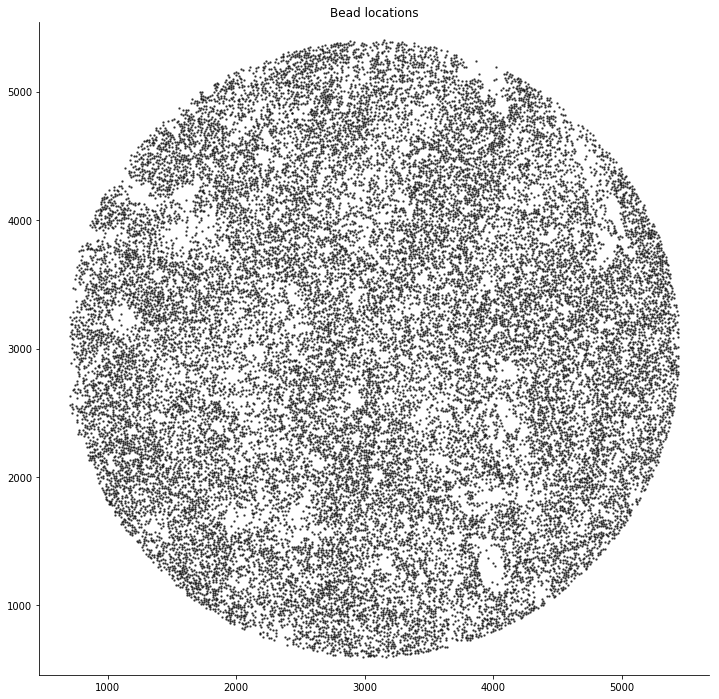

In [7]:
plt.figure(figsize(12, 12))
plt.scatter(coords['x'], coords['y'], c='k', s=2, alpha=0.6)
plt.axis('equal')
plt.title("Bead locations")
plt.show()

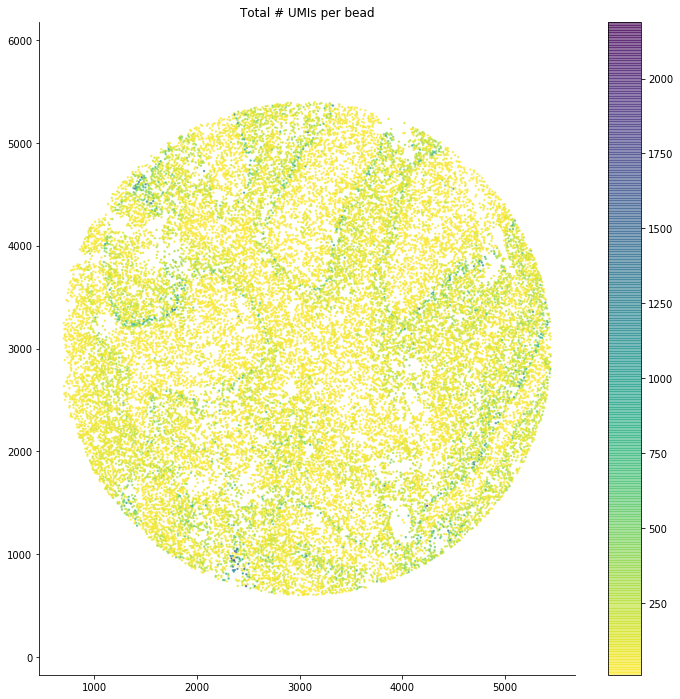

In [8]:
plt.figure(figsize(12, 12))
pyplot.set_cmap('viridis_r')
plt.scatter(coords['x'], coords['y'], 
            c=np.sum(counts.drop(['barcode'], axis=1), axis=1), 
            s=2, alpha=0.6)
plt.colorbar()
plt.axis('equal')
plt.title("Total # UMIs per bead")
plt.show()

Uncomment the code below if you want to visualize the expression of a set of genes of interest defined by the user in the list ```interesting_genes```.

In [9]:
#interesting_genes = ['C1qb', 'Gabra6', 'Mbp', 'Gad2', 'Car8',
#                     'Pcp4', 'Ppp1r17', 'Slc17a6', 'Slc1a3', 'Ttr']
#print(interesting_genes)
#for g in interesting_genes:
#    plot_one_gene(gene=g)

## Read reference data

In [5]:
tissue_path = os.path.join(data_path, "dge_hvgs.csv")
atlas_dge = pd.read_csv(tissue_path)

clusters_path = os.path.join(data_path, "cell_cluster_outcomes.csv")
cell_clusters = pd.read_csv(clusters_path)
cell_clusters.columns = ["barcode", "cluster", "subcluster", "reason"]

atlas_genes = atlas_dge.columns.tolist()

The user provides a dictionary that maps the numerical clusters from the annotation to their biological interpretation.

In [11]:
metacell_dict = {'1':"Granular",
                '2':"Purkinje",
                '3':"PV Interneurons",
                '4':"Other Interneurons",
                '5':"Microglia",
                '6':"Oligo- Poly-dendrocyte",
                '7':"Bergmann Glia",
                '8':"Astrocytes",
                '9':"Choroid Plexus",
                '10':"Endothelial Stalk",
                '11':"Muraland Tip"}
celltype_dict = {1:"Granular",
                2:"Purkinje",
                3:"PV Interneurons",
                4:"Other Interneurons",
                5:"Microglia",
                6:"Oligo- Poly-dendrocyte",
                7:"Bergmann Glia",
                8:"Astrocytes",
                9:"Choroid Plexus",
                10:"Endothelial Stalk",
                11:"Muraland Tip"}

plot_size_dict = {10:4, 20:8, 40:20, 100:140}

ct_names = list(metacell_dict.values())

# NMF on Reference

In [12]:
# need to have both the sample and the reference over a shared set of features
gene_intersection = list(set(atlas_genes) & set(counts.columns.drop('barcode')))
atlasdge = atlas_dge[gene_intersection]

# preprocess the reference for NMF
cell_totalUMIa = np.sum(atlasdge, axis = 1)
atlasdge_cellnorm = np.divide(atlasdge, cell_totalUMIa[:,None])
atlasdge_scaled = StandardScaler(with_mean=False).fit_transform(atlasdge_cellnorm)

The user specifies hyperparameters below:
* ```K``` is the number of NMF factors
* ```random_state``` is necessary to specify because the solution to NMF is stochastic and depends on the randomly chosen initial starting point.

In [13]:
K = 30
random_state = 17

Run NMF

In [14]:
model = NMF(n_components=K, init='random', random_state = random_state)
Ha = model.fit_transform(atlasdge_scaled)
Wa = model.components_

## Check if the basis derived from NMF is interpretable

Rescale the coeficients (address the non-identifiability of NMF)

In [15]:
Ha_norm = StandardScaler(with_mean=False).fit_transform(Ha)
Ha_norm = pd.DataFrame(Ha_norm)
Ha_norm['barcode'] = atlasdge.index.tolist()

Assign cluster identity to samples from the reference dataset to be their highest loading NMF factor

In [16]:
maxloc = Ha_norm.drop('barcode', axis=1).values.argmax(axis=1)
cell_clusters['maxloc'] = maxloc
cell_clusters.head()

,barcode,cluster,subcluster,reason,maxloc
0,P60CBRep1P1_GACTCTACACCC,4,4-1,NaN,27
1,P60CBRep1P1_TATTATATCTAA,2,2,curation,3
2,P60CBRep1P1_GCGTCGCCAGTT,10,10-3,NaN,20
3,P60CBRep1P1_CTATCGATTTCN,2,2,curation,3
4,P60CBRep1P1_GTACCTGAGCCT,4,4-3,NaN,15


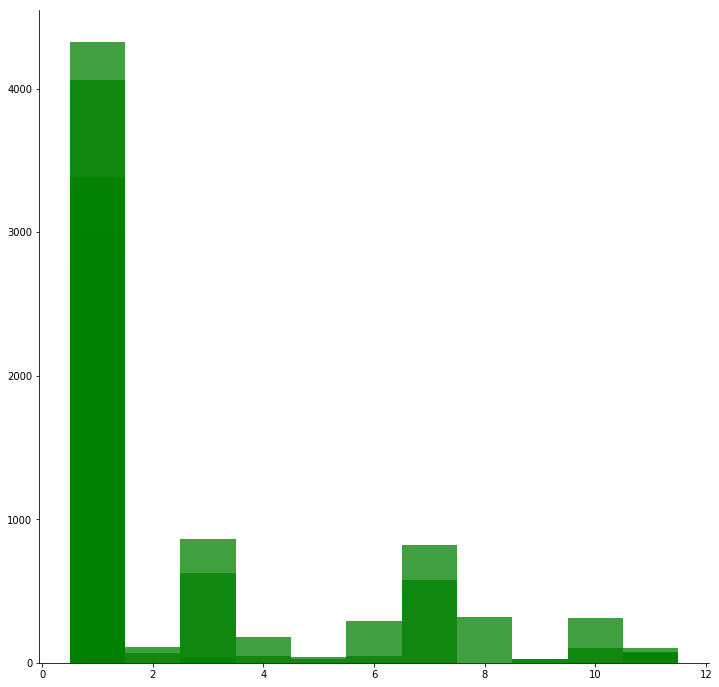

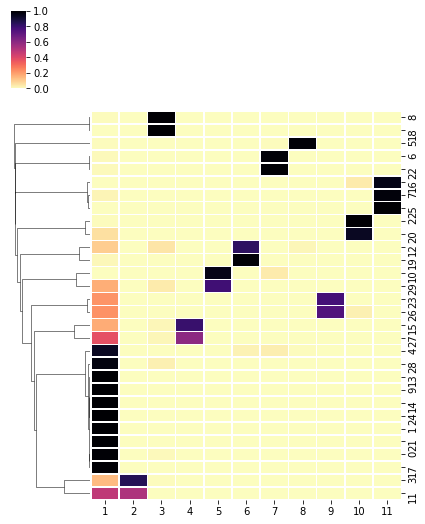

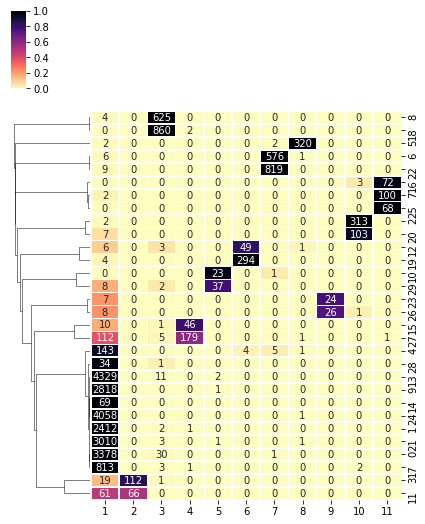

In [17]:
num_atlas_clusters = np.unique(cell_clusters['cluster']).size

factor_to_celltype_df = pd.DataFrame(0, index=range(1, num_atlas_clusters+1), 
                                     columns=range(K))
for k in range(K):
    n, bins, patches = plt.hist(cell_clusters['cluster'][cell_clusters['maxloc'] == k],
            range = (0.5, num_atlas_clusters+0.5), 
                                bins = int(num_atlas_clusters), 
                                facecolor='green', alpha=0.75)
    factor_to_celltype_df[k] = n.astype(int)
    
factor_to_celltype_df = factor_to_celltype_df.T

factor_total = np.sum(factor_to_celltype_df, axis = 1)
factor_to_celltype_df_norm = np.divide(factor_to_celltype_df, 
                                       factor_total[:,None])

cx = sns.clustermap(factor_to_celltype_df_norm, fmt = 'd',
                cmap="magma_r", linewidth=0.5, col_cluster = False,
                   figsize=(7, 9))

ax = sns.clustermap(factor_to_celltype_df_norm, fmt = 'd',
        cmap="magma_r", linewidth=0.5, col_cluster = False,
        annot = factor_to_celltype_df.loc[cx.dendrogram_row.reordered_ind],
        figsize=(7, 9))

maxloc_fc = factor_to_celltype_df.values.argmax(axis=1)
factor_to_celltype_dict = {factor : ctype + 1 for factor, ctype in enumerate(maxloc_fc)}

celltype_to_factor_dict = {}
for c in range(1, num_atlas_clusters + 1):
    celltype_to_factor_dict[c] = [k for k, v in factor_to_celltype_dict.items() if v == c]
    
WaT = Wa.T

Ha = pd.DataFrame(Ha)
Ha['cellname'] = atlasdge.index.tolist()

Ha_norm = StandardScaler(with_mean=False).fit_transform(Ha.drop('cellname', 
                                                                axis=1))

Ha_norm = pd.DataFrame(Ha_norm)
Ha_norm['cellname'] = atlasdge.index.tolist()

An interpretable/useful basis will result in a heatmap above where majority of rows have a high contribution in only one class, and ideally 0 in all the rest.

In [18]:
nonzero_beads = np.sum(counts[gene_intersection], axis=1)!=0
counts = counts[nonzero_beads]
coords = coords[nonzero_beads]
coords.reset_index(drop=True, inplace=True)

co = collections.Counter(factor_to_celltype_dict.values())

Check the number of samples from the reference dataset that got misclassified in the NMF basis. Along with the number of misclassified samples we provide a histogram that shows how the mismatches are distributed across the original labels.

num mismatched: 189


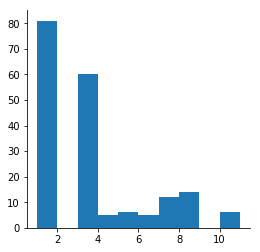

In [19]:
cell_deconv_df, mismatch_dfl2, cell_maxct_df = cell_deconv(collapse='l2')

If the NMF basis does not appear to be reliable, experiment with changing the hyperparameters ```K, random_state``` and the collapse option (choose one of) ```'l2', 'sum'``` or, ```'mean'```.

For each sample from the reference dataset, check its deconvolution across the labels

In [20]:
cell_totalloading = np.sum(cell_deconv_df.drop('cellname', axis=1), axis = 1)
cell_deconv_df_norm = np.true_divide(cell_deconv_df.drop('cellname', axis=1), 
                                     cell_totalloading[:,None])
cell_deconv_df_norm['cellname'] = cell_deconv_df['cellname']
cell_deconv_df_norm.head()

,Granular,Purkinje,PV Interneurons,Other Interneurons,Microglia,Oligo- Poly-dendrocyte,Bergmann Glia,Astrocytes,Choroid Plexus,Endothelial Stalk,Muraland Tip,cellname
0,0.083840,0.013095,0.002290,0.823726,0.001799,0.000000,0.007927,0.000000,0.012528,0.054795,0.000000,P60CBRep1P1_GACTCTACACCC
1,0.097812,0.848646,0.018753,0.005534,0.000195,0.002380,0.008731,0.006733,0.000000,0.000000,0.011216,P60CBRep1P1_TATTATATCTAA
2,0.088020,0.000000,0.000000,0.007557,0.027291,0.016483,0.000000,0.000000,0.004810,0.855839,0.000000,P60CBRep1P1_GCGTCGCCAGTT
3,0.095120,0.842784,0.038192,0.000000,0.000000,0.003144,0.007102,0.001275,0.006200,0.000000,0.006184,P60CBRep1P1_CTATCGATTTCN
4,0.168221,0.009650,0.135990,0.547863,0.011181,0.083753,0.003333,0.001776,0.021719,0.008658,0.007857,P60CBRep1P1_GTACCTGAGCCT


Now visualize the above dataframe per cluster label. Below we see summary plots, one per cluster label, of the loadings of samples from the reference across the different labels.

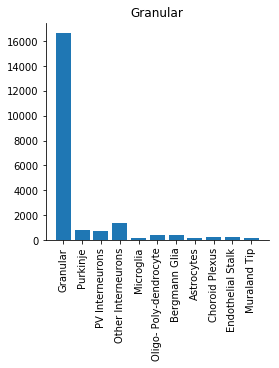

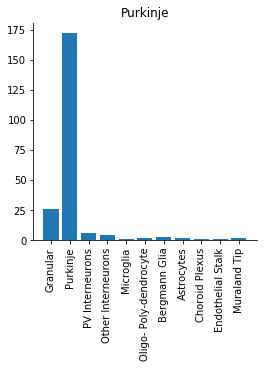

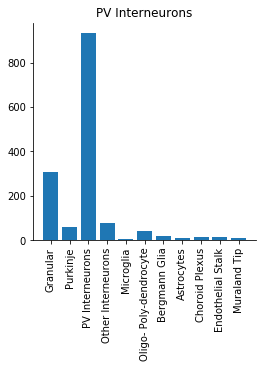

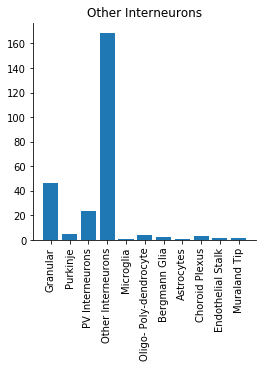

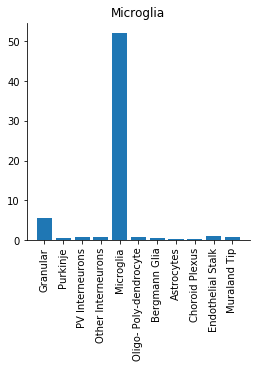

...

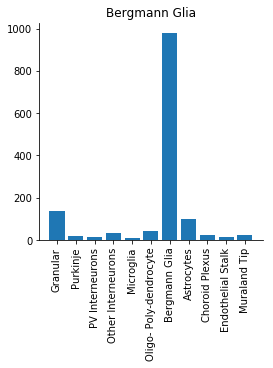

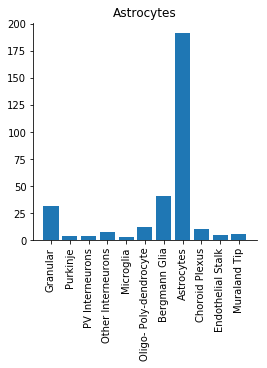

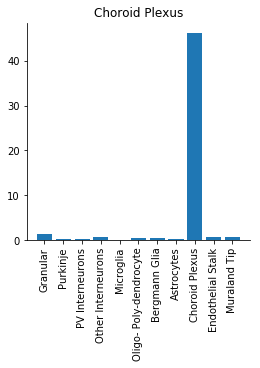

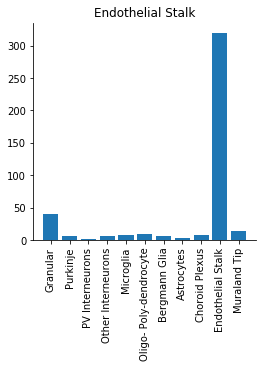

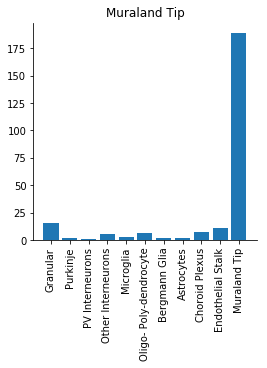

In [21]:
plot_bar_cellt(cell_deconv_df_norm=cell_deconv_df_norm, cell_maxct_df=cell_maxct_df)

## Derive certainty thresholds

Here we consider the largest false positive as a certainty threshod. To unpack this, lets look at a concrete example. Say you have the Slide-seq beads deconvolved across the different celltypes, and you want to assign a singular celltype identity to a given bead. Trivially, you can select the celltype with the highest contribution. But a question remains -- is this contribution high enough to be confident that this bead only got input from a single celltype? To address this we look back at the deconvolution of the reference single cell atlas data and ask ourselves -- for the dominant celltype in this bead, e.g. Purkinje, look at all **non**-Purkinje cells from the reference, and extract the highest value in the Purkinje column among all such cells. This is our heuristic measure of how high of a Purkinje loading we expect to observe in the worst case scenario for a non-Purkinje cell. If our (candidate) Purkinje bead has a Purkinje loading lower than that threshold, we deem it not to be of the Purkinje type, even thoough that is its highest-contributing class according to our deconvolution.

Below we visualize this idea. For a given celltype, in green we have the distribution of loadings for cells in that celltype, and in red, the loading for cells from all other celltypes. 

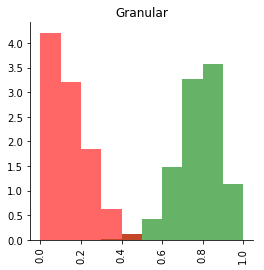

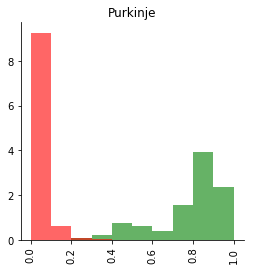

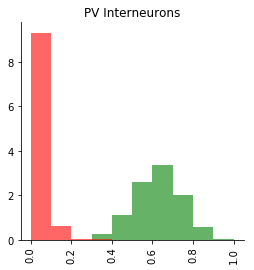

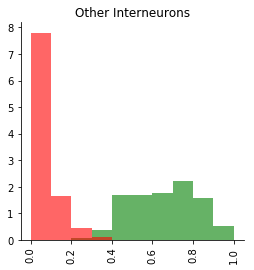

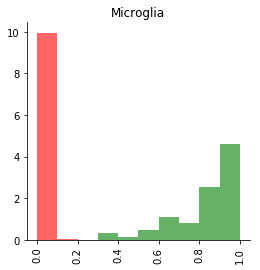

...

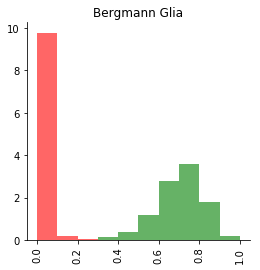

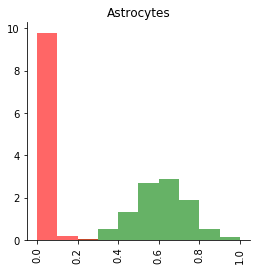

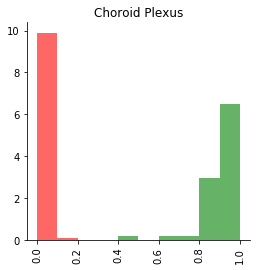

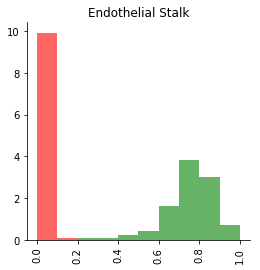

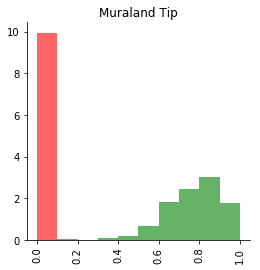

In [22]:
posneg_dict = plot_hist_TF(metacell_dict)

In [23]:
thresh_certainty = [0]*num_atlas_clusters
for c in range(1, 1+num_atlas_clusters):
    thresh_certainty[c-1] = np.max(posneg_dict[str(c)][1])
thresh_certainty

[0.4862222807212809,
 0.45272717186790734,
 0.4816102117046463,
 0.4826849217969242,
 0.4645426239541576,
 0.451463278798259,
 0.4509749789006065,
 0.47601316977938923,
 0.42915934566028313,
 0.4194246223851286,
 0.3879019486935994]

# NMFreg on Sample

In [24]:
Hs, Hs_norm, puckcounts, bead_deconv_df, barcode_clusters, bead_maxct_df = NMFreg(counts=counts, 
                                             coords=coords, size=10)
#Hs_norm.to_csv("{}/Hs_norm.csv".format(aggregated_data_path), index=False)
#bead_deconv_df.to_csv("{}/bead_deconv_df.csv".format(aggregated_data_path), index=False)
#barcode_clusters.to_csv("{}/barcode_clusters.csv".format(aggregated_data_path), index=False)
#bead_maxct_df.to_csv("{}/bead_maxct_df.csv".format(aggregated_data_path), index=False)

100%|██████████| 27249/27249 [02:30<00:00, 180.81it/s]
/Users/agoeva/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


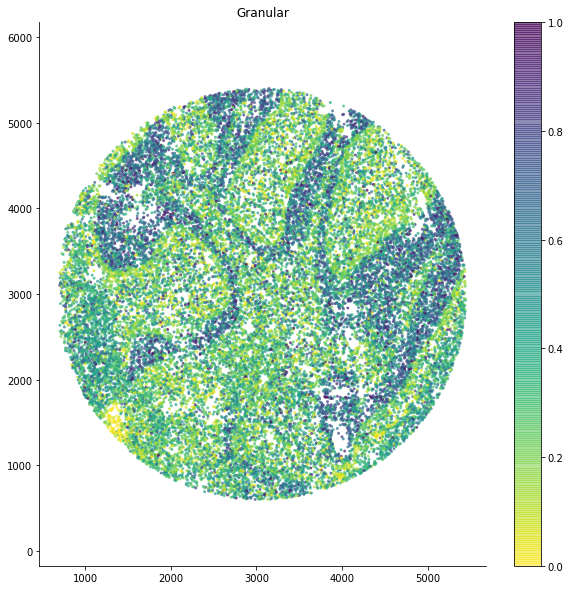

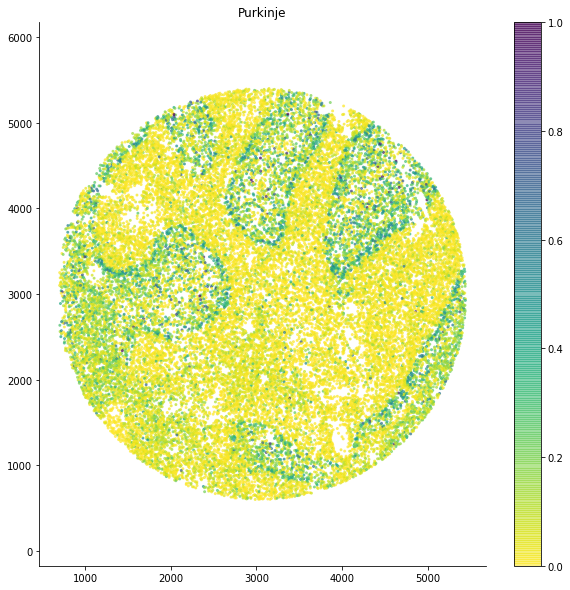

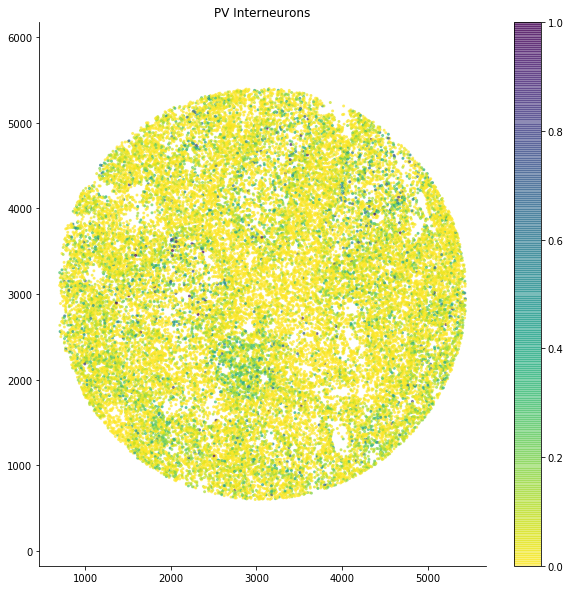

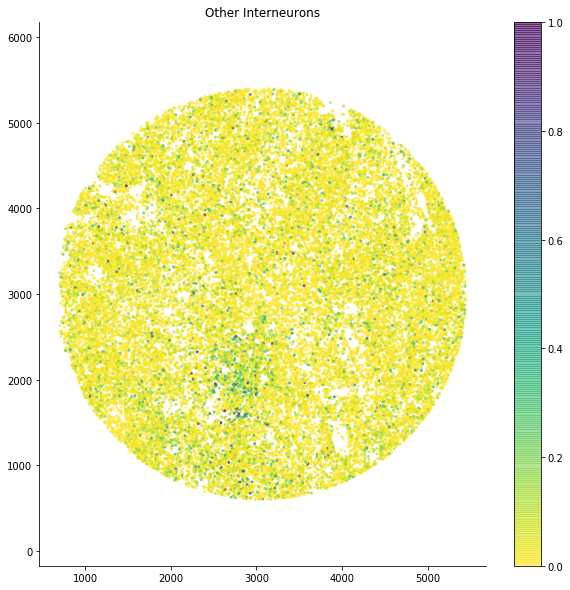

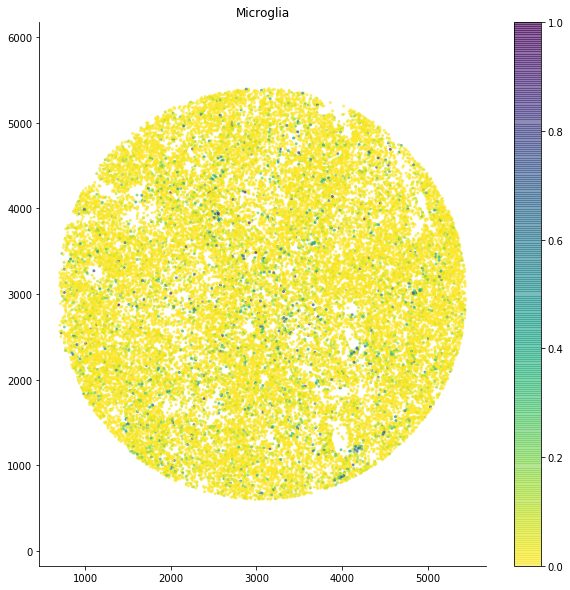

...

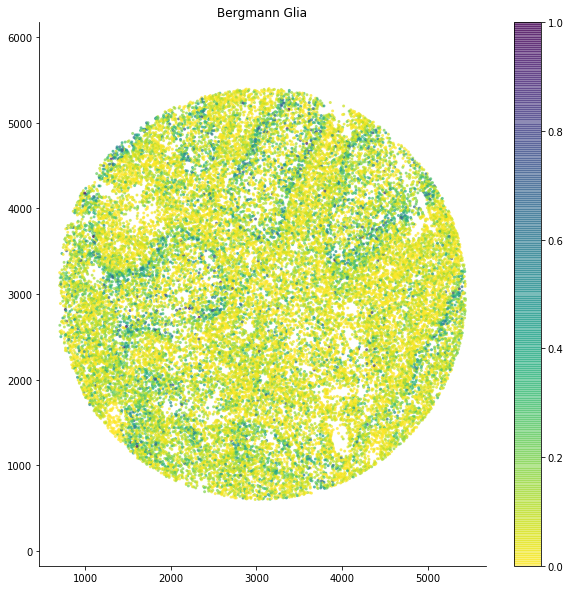

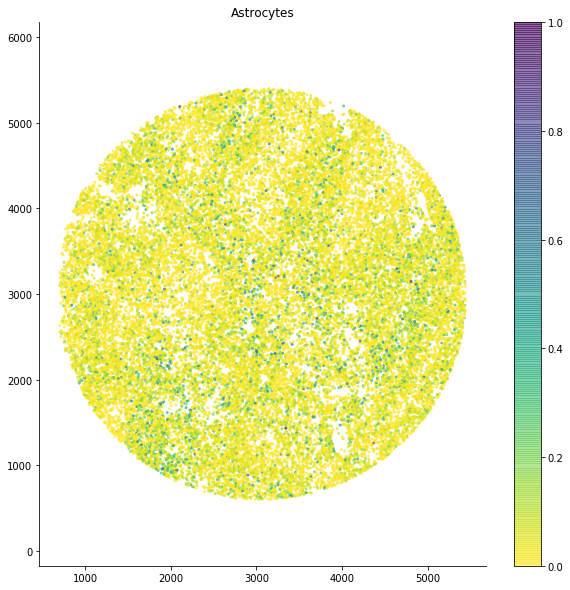

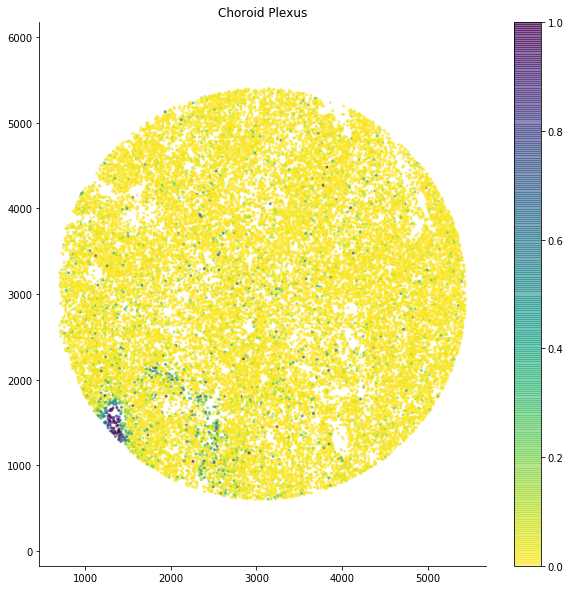

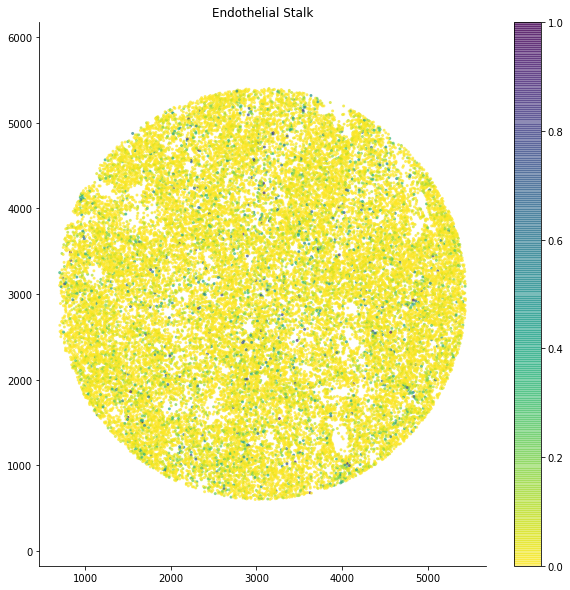

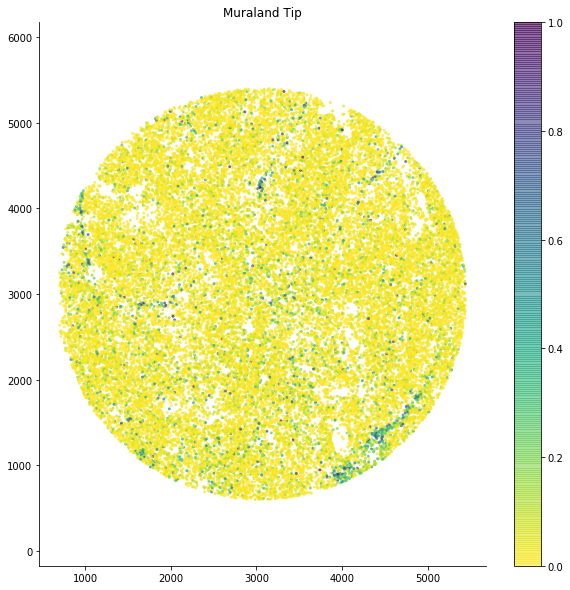

In [25]:
bead_deconv_df_norm = plot_ct_loadings(coords=coords, size=10, 
                        puckcounts=puckcounts, 
                        bead_deconv_df=bead_deconv_df)

## Deconvolved sample

The relative contributions from each celltype in each bead are contained in the dataframe ```bead_deconv_df_norm```.

In [26]:
bead_deconv_df_norm.head()

,Granular,Purkinje,PV Interneurons,Other Interneurons,Microglia,Oligo- Poly-dendrocyte,Bergmann Glia,Astrocytes,Choroid Plexus,Endothelial Stalk,Muraland Tip,barcode
0,0.378790,0.029843,0.290721,0.167439,0.000000,0.000000,0.133207,0.0,0.000000,0.000000,0.000000,TTCTCCAAGGCCG
1,0.423055,0.078015,0.000000,0.244596,0.037773,0.022937,0.118359,0.0,0.005546,0.061213,0.008505,TACTAAAGAATTA
2,0.160810,0.093499,0.000000,0.000000,0.025315,0.675382,0.034952,0.0,0.005329,0.004713,0.000000,TCTCTTAGTTGGC
3,0.674768,0.044012,0.000000,0.000000,0.150760,0.047670,0.000000,0.0,0.000000,0.082790,0.000000,GCTTTTCGTTCCC
4,0.282630,0.017243,0.000000,0.000000,0.000867,0.545182,0.154078,0.0,0.000000,0.000000,0.000000,TACGGGCGAAAAG


In [27]:
df_clust = df_clust(coords=coords, bead_maxct_df=bead_maxct_df)
df_clust.head()

,x,y,label
0,1478.453901,1810.524823,1
1,2224.000000,1230.397849,1
2,1914.742424,2221.954545,6
3,1682.151515,3886.575758,1
4,2416.261194,4216.902985,6


## Plot certainty per cell type (Thresholded)

/Users/agoeva/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:323: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


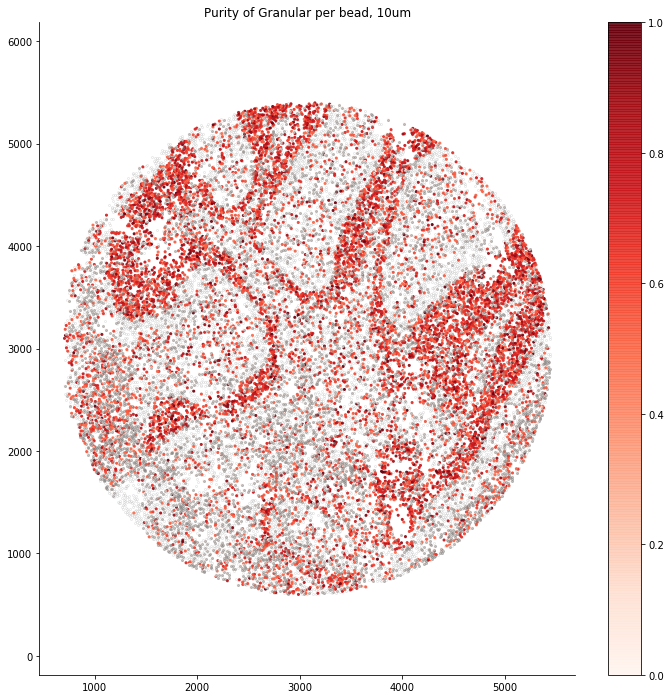

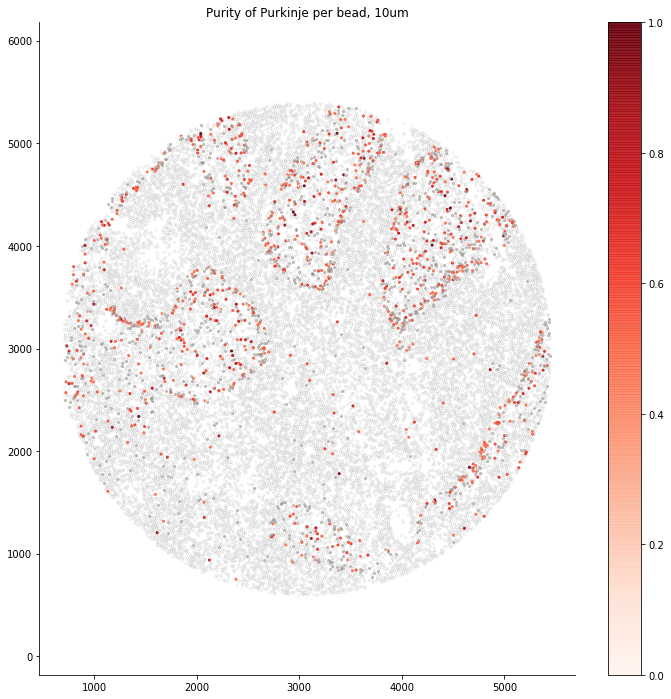

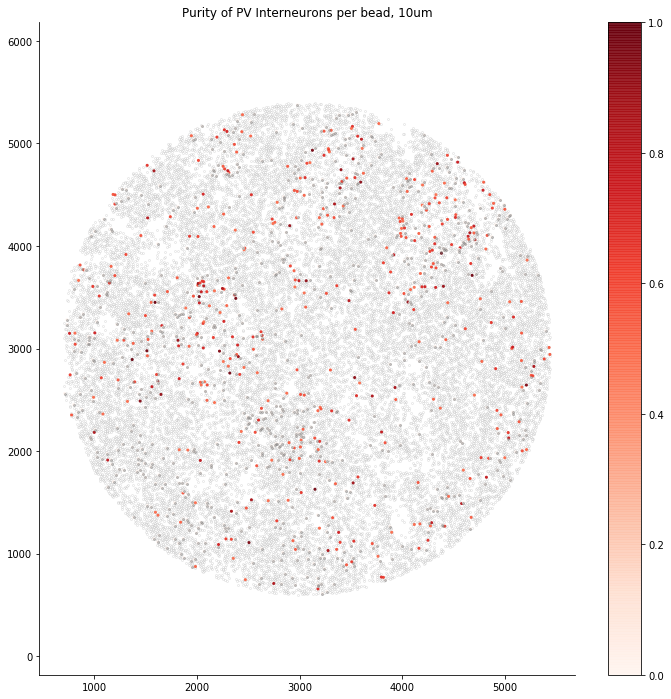

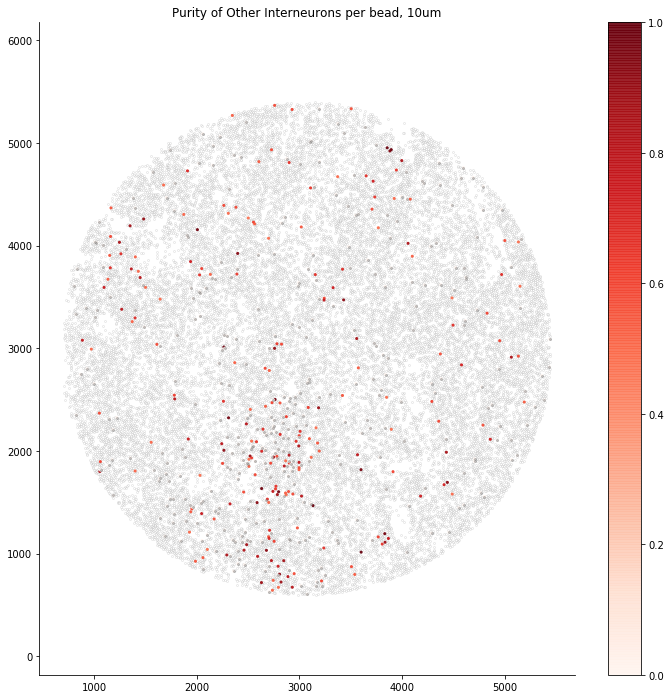

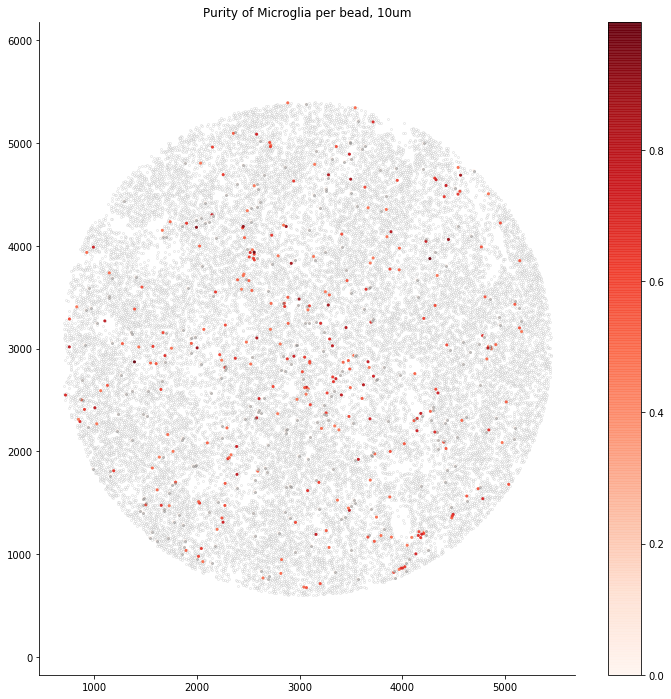

...

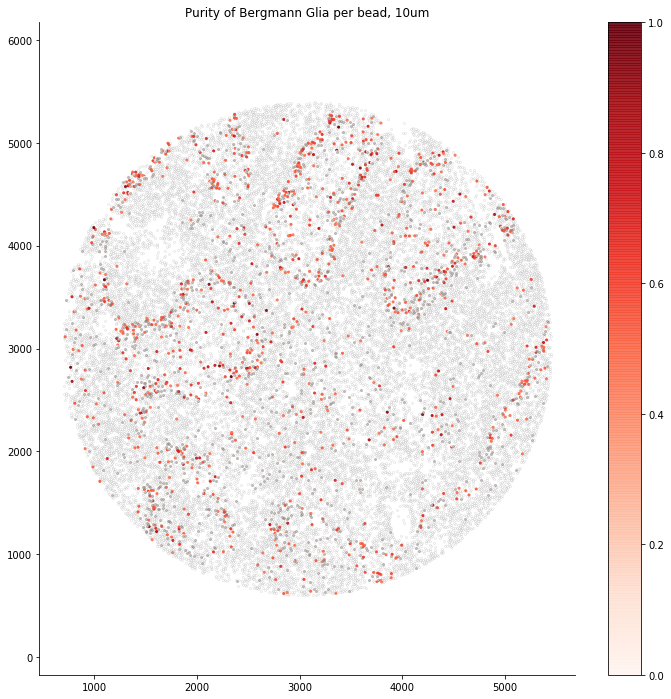

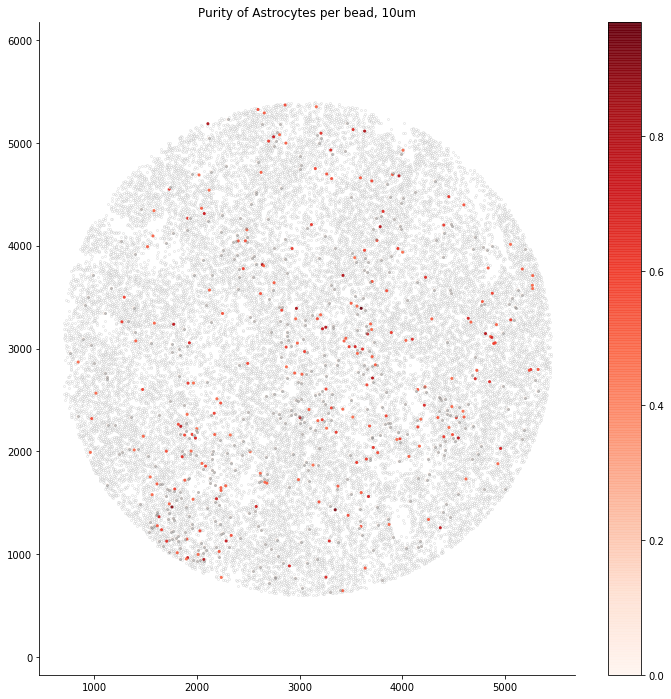

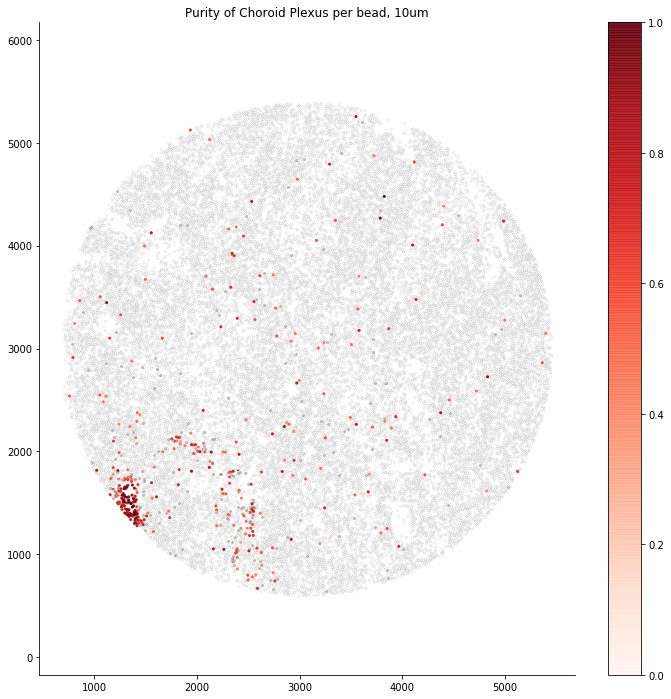

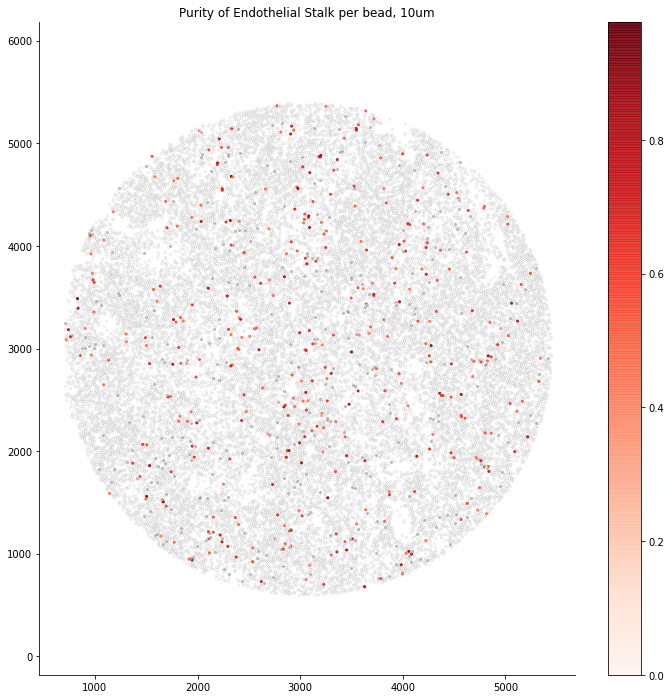

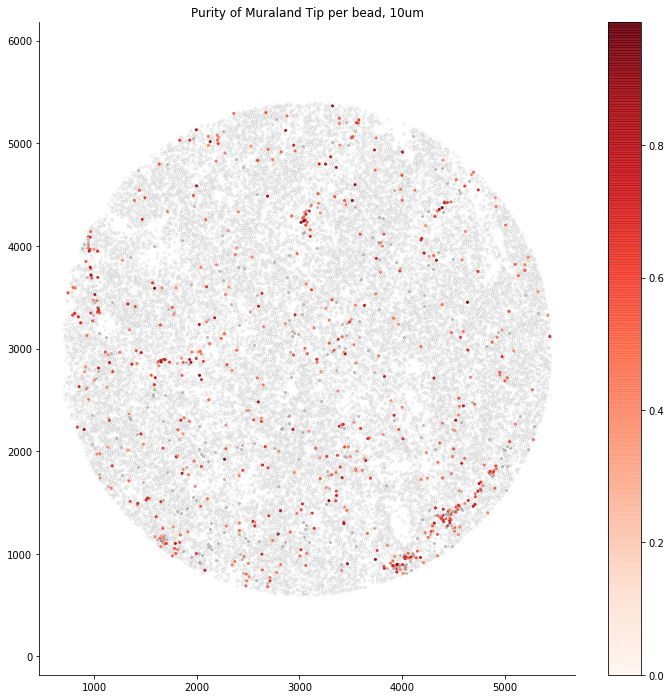

In [28]:
keep_thresh_df, remove_thresh_df = plot_certainty_perct_thresh(coords=coords, 
                                          size=10, 
                                          bead_deconv_df_norm=bead_deconv_df_norm, 
                                          df_clust=df_clust,
                                          bead_maxct_df=bead_maxct_df)

Granular
total: 16176
keep: 9596
remove: 6580
certainty thresh: 0.4862
____________


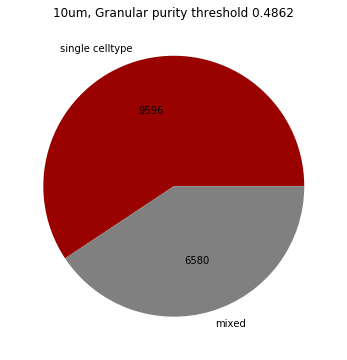

Purkinje
total: 2156
keep: 898
remove: 1258
certainty thresh: 0.4527
____________


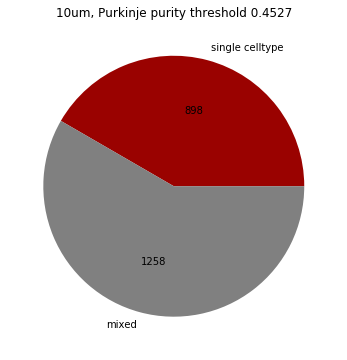

PV Interneurons
total: 1192
keep: 406
remove: 786
certainty thresh: 0.4816
____________


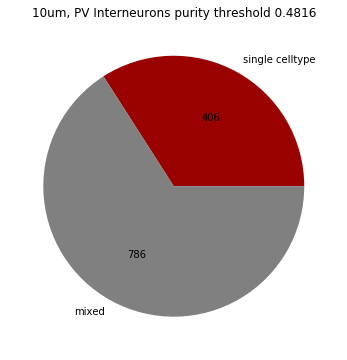

Other Interneurons
total: 577
keep: 215
remove: 362
certainty thresh: 0.4827
____________


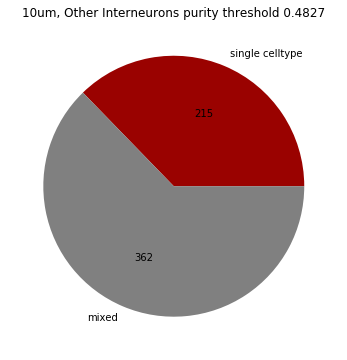

Microglia
total: 562
keep: 277
remove: 285
certainty thresh: 0.4645
____________


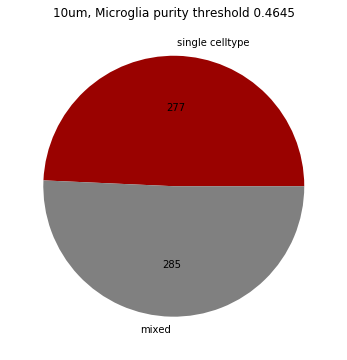

Oligo- Poly-dendrocyte
total: 1479
keep: 674
remove: 805
certainty thresh: 0.4515
____________


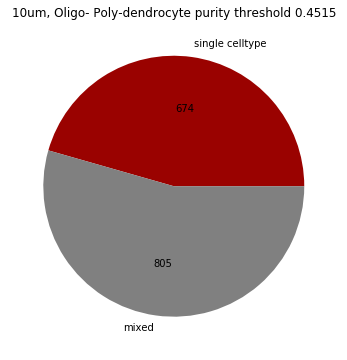

Bergmann Glia
total: 2330
keep: 940
remove: 1390
certainty thresh: 0.451
____________


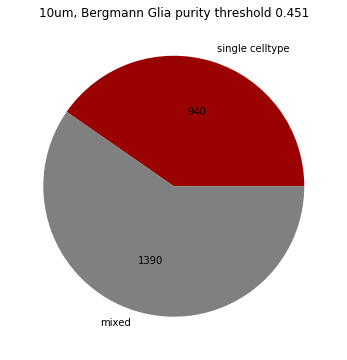

Astrocytes
total: 701
keep: 233
remove: 468
certainty thresh: 0.476
____________


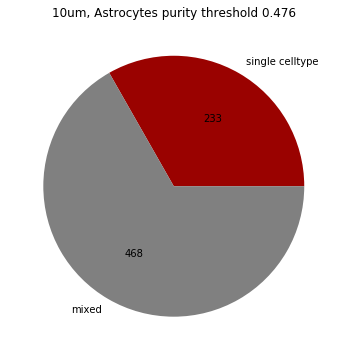

Choroid Plexus
total: 513
keep: 322
remove: 191
certainty thresh: 0.4292
____________


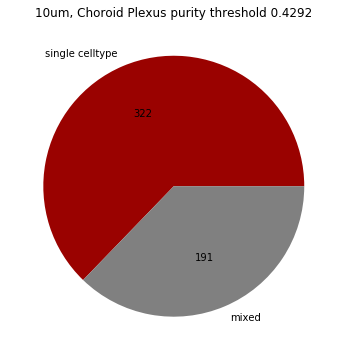

Endothelial Stalk
total: 713
keep: 367
remove: 346
certainty thresh: 0.4194
____________


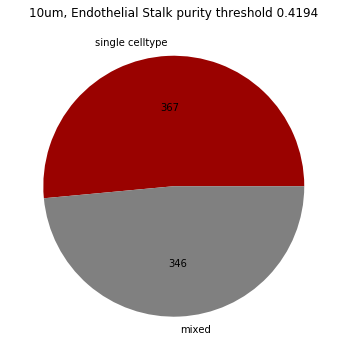

Muraland Tip
total: 850
keep: 552
remove: 298
certainty thresh: 0.3879
____________


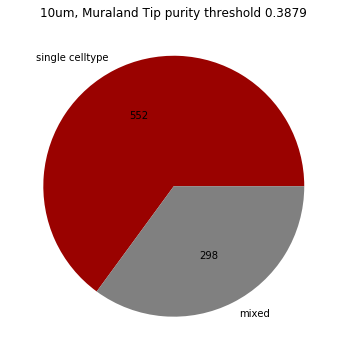

In [29]:
plot_pie(size=10, bead_deconv_df_norm=bead_deconv_df_norm, 
         keep_thresh_df=keep_thresh_df, 
         remove_thresh_df=remove_thresh_df)

In [30]:
bead_deconv_df_norm['thresh_ct'] = bead_deconv_df_norm['maxval']
bead_deconv_df_norm = func_thresh_certainty(bead_deconv_df_norm=bead_deconv_df_norm, 
                                         keep_thresh_df=keep_thresh_df)

/Users/agoeva/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:175: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/agoeva/anaconda/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


## Plot all celltypes (Thresholded)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

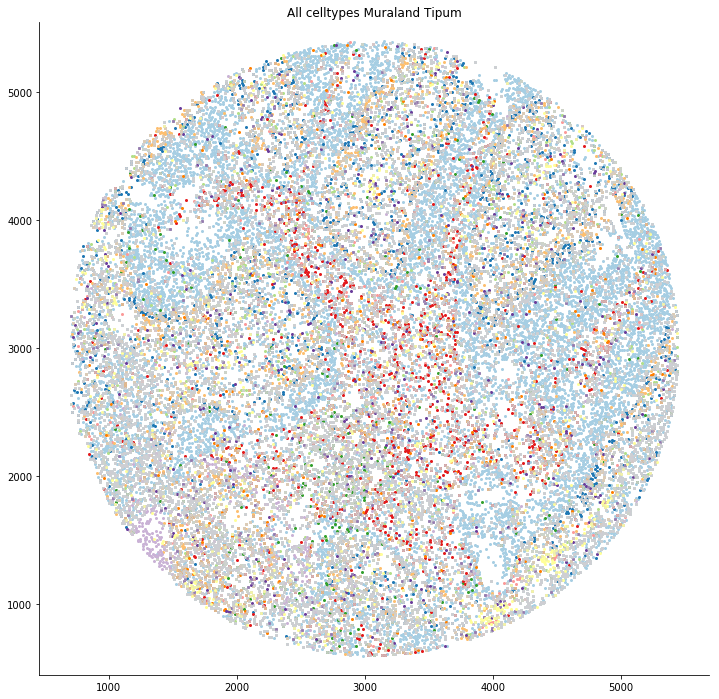

In [31]:
bead_deconv_df_norm = plot_allct_thresh(coords=coords, size=10, 
            bead_deconv_df_norm=bead_deconv_df_norm, 
            bead_maxct_df=bead_maxct_df)
#df_clust.to_csv("{}/df_clust.csv".format(aggregated_data_path), index=False)
#bead_deconv_df_norm.to_csv("{}/bead_deconv_df_norm.csv".format(aggregated_data_path), index=False)

## Plot Binary (Thresholded)

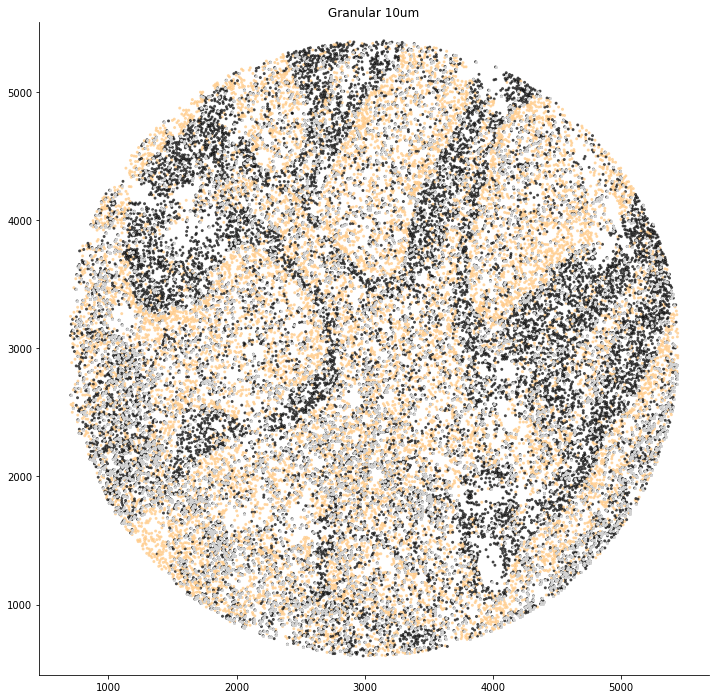

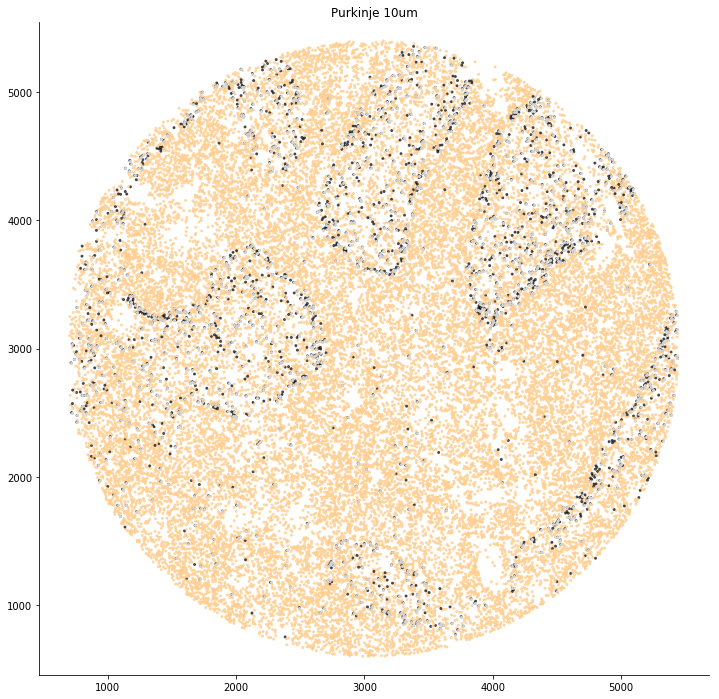

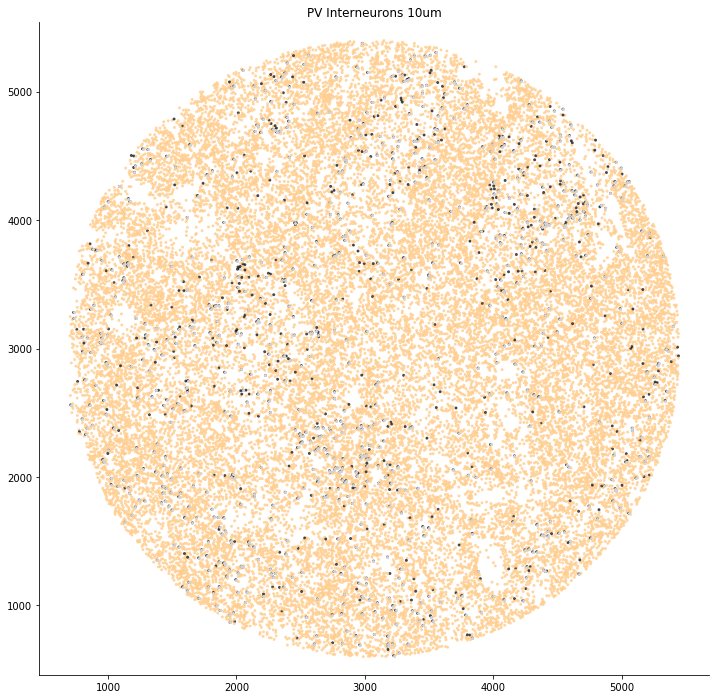

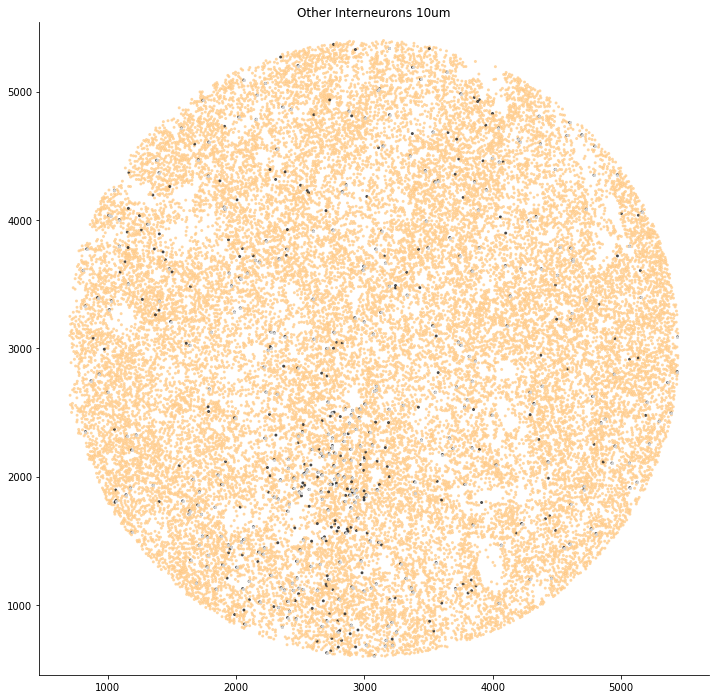

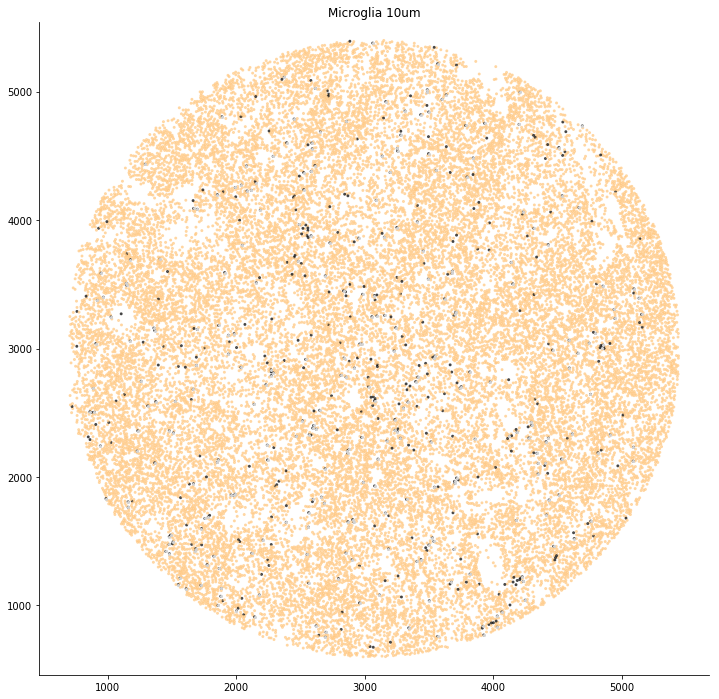

...

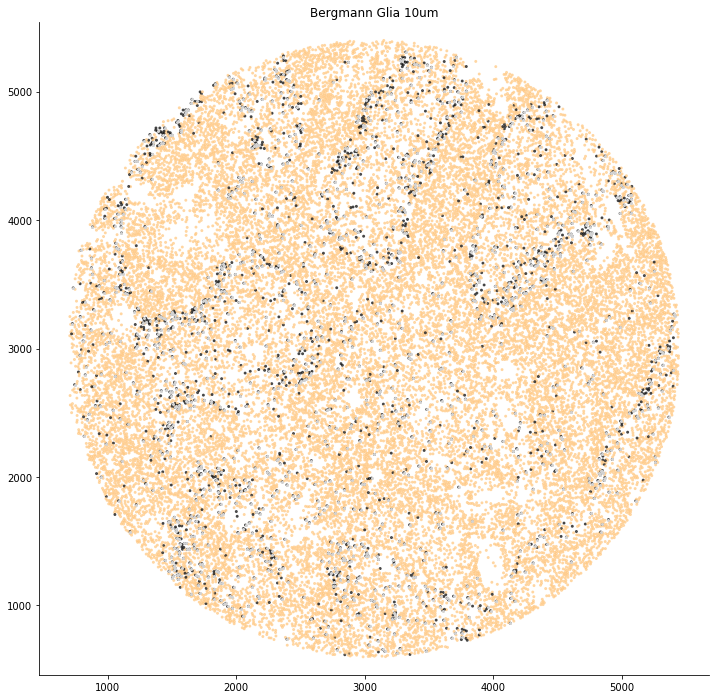

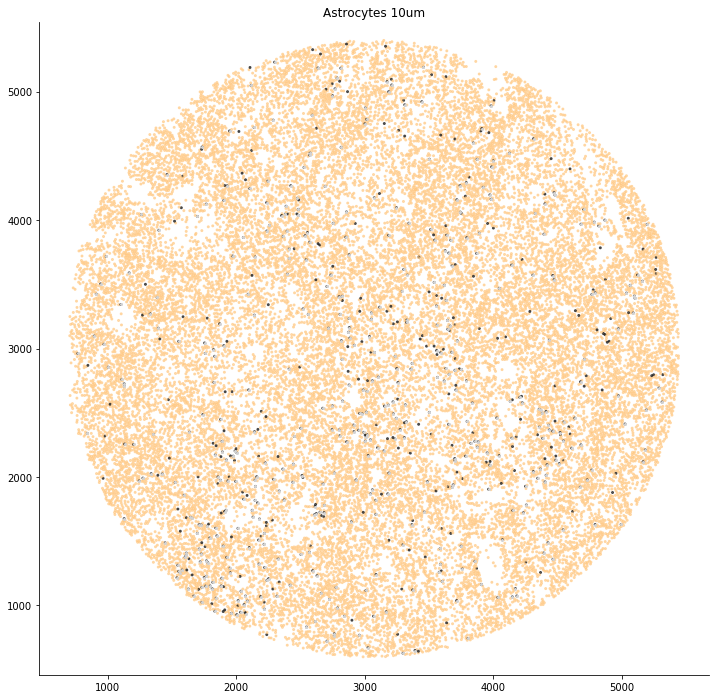

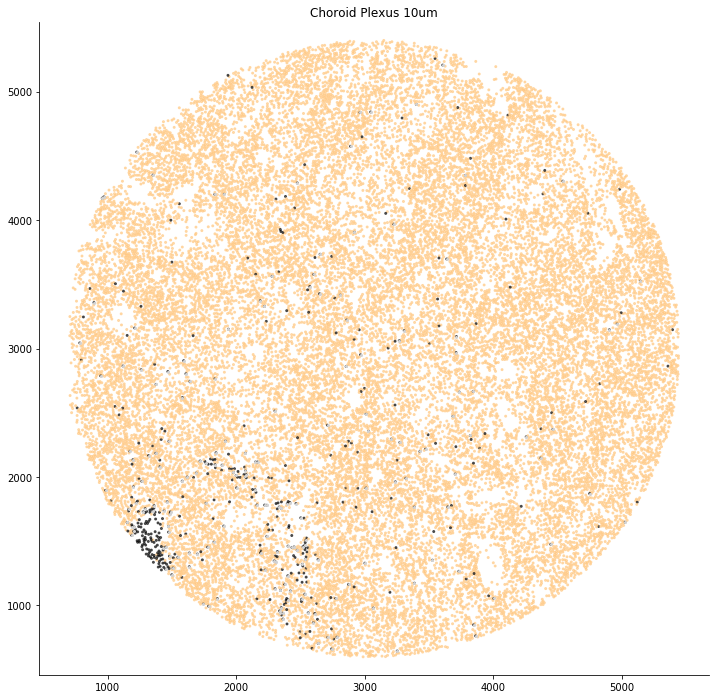

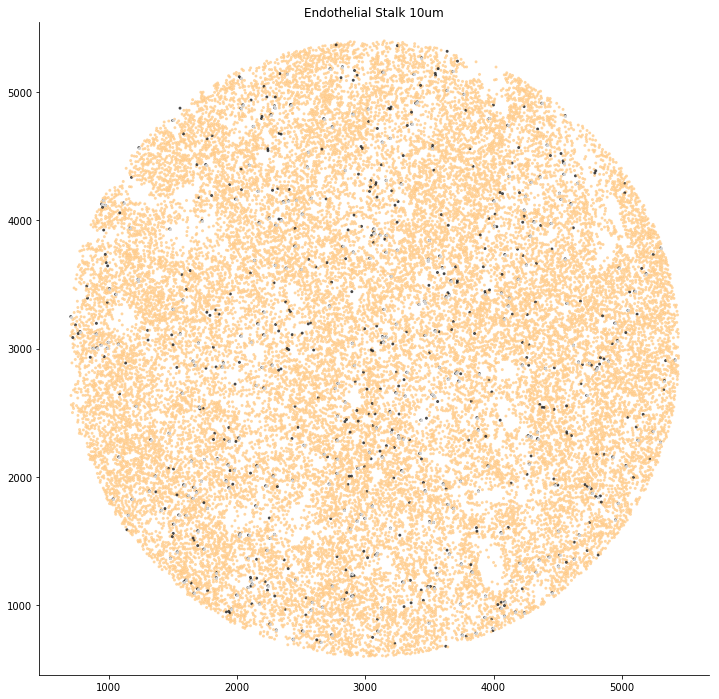

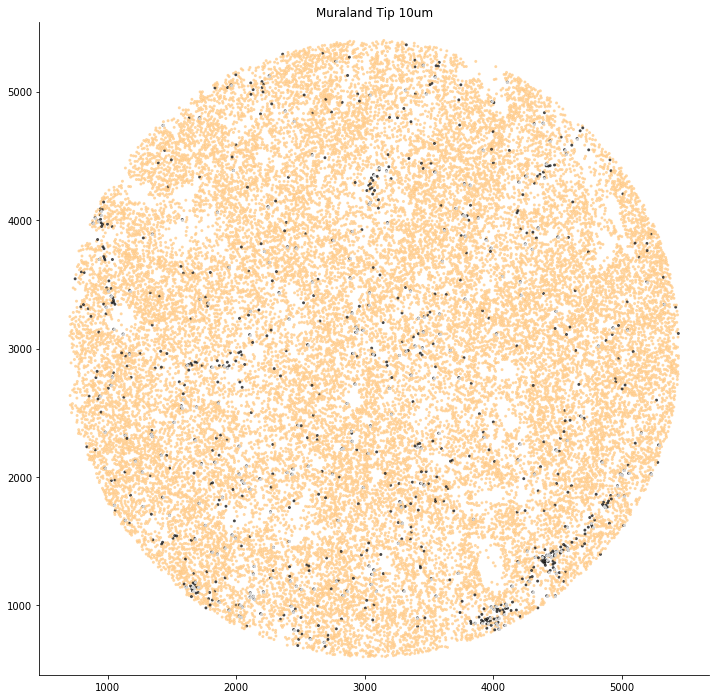

In [32]:
plot_boolean_thresh(size=10, coords=coords, bead_maxct_df=bead_maxct_df,
                   bead_deconv_df_norm=bead_deconv_df_norm)

## Plot Certainty (Thresholded)

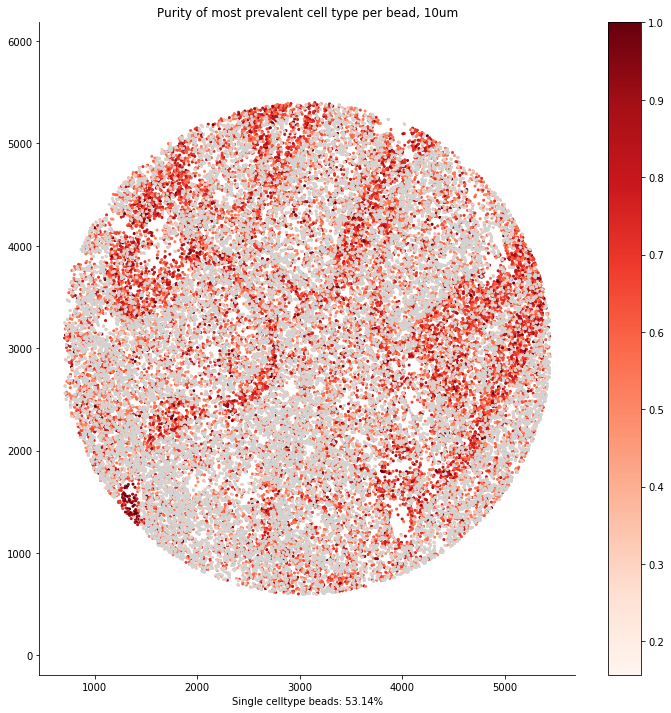

In [33]:
plot_certainty_thresh(coords=coords, size=10, bead_deconv_df_norm=bead_deconv_df_norm)

## Bar plots

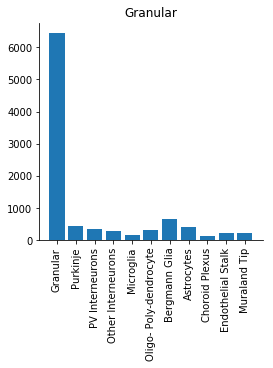

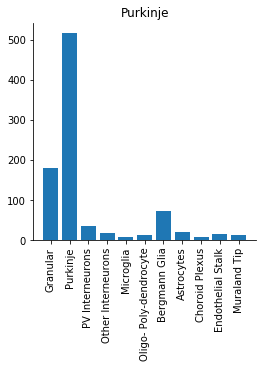

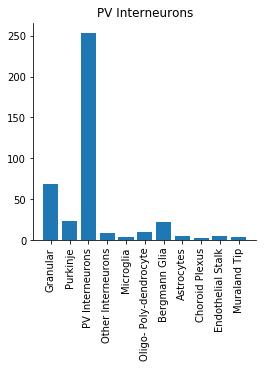

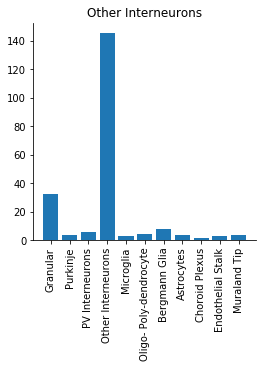

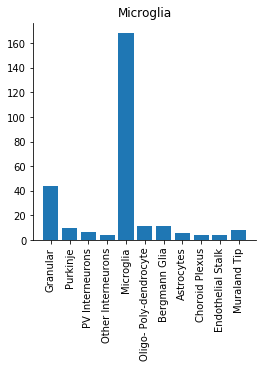

...

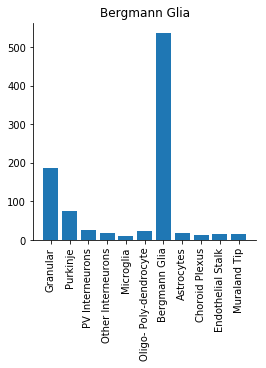

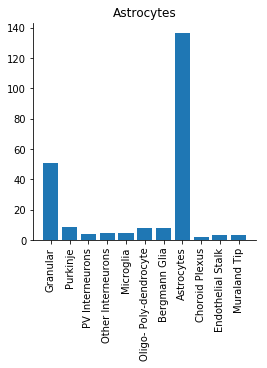

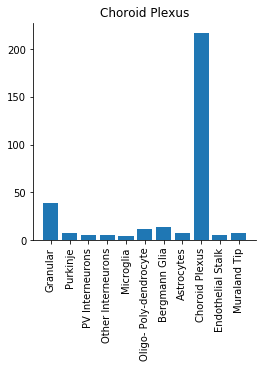

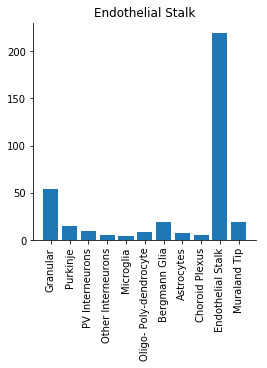

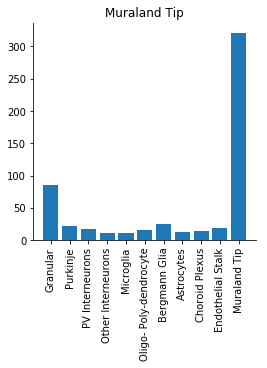

In [34]:
sub_df = bead_deconv_df_norm['thresh_ct']!=0
plot_bar_ct(bead_deconv_df_norm=bead_deconv_df_norm[sub_df], df_clust=df_clust[sub_df], size=10)